In [1]:
library(Seurat)
library(Signac)
library(Matrix)
library(ggplot2)
library(BuenColors)
library(dplyr)
library(EnsDb.Hsapiens.v86)
library(ggpointdensity)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect


Loading required package: MASS


Attaching package: ‘dplyr’


The following object is masked from ‘package:MASS’:

    select


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: ensembldb

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:SeuratObject’:

    intersect


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, aperm, append, as.data.frame, basename, cbind,
    colnames, dirname, do.cal

Importing ATAC object

In [2]:
ATAC_seurat_obj=readRDS("~/github_reproducibility/merged_seurat_object_step2_all_reps_with_LSI.RDS")

Importing RNA object

In [3]:
seurat_obj=readRDS("~/github_reproducibility/merged_seurat_object_step2_with_umap.RDS")

In [4]:
seurat_obj=seurat_obj[,colnames(ATAC_seurat_obj)]

WNN integration

In [5]:
joint_object=seurat_obj
joint_object[['ATAC']]=ATAC_seurat_obj[['ATAC']]

Warning message:
"Assay ATAC changing from ChromatinAssay to Assay"
Warning message:
"Key 'atac_' taken, using 'ydgab_' instead"


In [6]:

joint_object[["lsi"]] <- ATAC_seurat_obj[["lsi"]]

joint_object[["umap_atac"]] <- ATAC_seurat_obj[["umap"]]


Warning message:
"Key 'umap_' taken, using 'umapatac_' instead"


In [7]:
joint_object <- FindMultiModalNeighbors(joint_object, reduction.list = list("pca", "lsi"), dims.list = list(1:50, 2:50))
joint_object <- RunUMAP(joint_object, nn.name = "weighted.nn", reduction.name = "wnn.umap", reduction.key = "wnnUMAP_")
joint_object <- FindClusters(joint_object, graph.name = "wsnn", algorithm = 3, verbose = FALSE)

Calculating cell-specific modality weights

Finding 20 nearest neighbors for each modality.

Calculating kernel bandwidths

Finding multimodal neighbors

Constructing multimodal KNN graph

Constructing multimodal SNN graph

Warning message:
"The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session"
19:02:45 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by 'BiocGenerics'

19:02:47 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 20

19:02:53 Initializing from normalized Laplacian + noise (using RSpectra)

19:03:01 Commencing optimization for 200 epochs, with 4357084 positive edges

19:04:38 Optimization finished



In [9]:
library(ggplot2)

Annotations from John Dick's preprint:

In [11]:
JAN_028_filt_metadata_john_dick=read.table("~/JAN_028/JAN_028_filt_metadata_john_dick.csv",header=TRUE,sep=',')

In [12]:
joint_object@meta.data$john_dick_annotation=JAN_028_filt_metadata_john_dick$annotation

In [13]:
library(BuenColors)

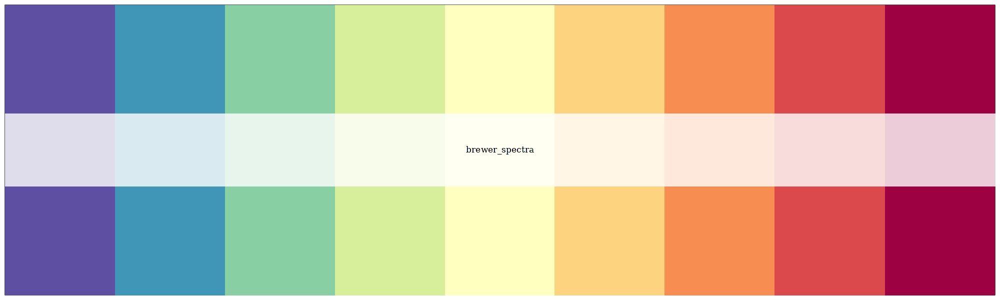

In [14]:
jdb_palette("brewer_spectra")

In [15]:
top_john_dick_annotations=head(names(sort(table(joint_object@meta.data$john_dick_annotation),decreasing=TRUE)),26)

In [16]:
library(dplyr)


In [17]:
output_folder="~/0_perturb_multiome_manuscript_figures/"

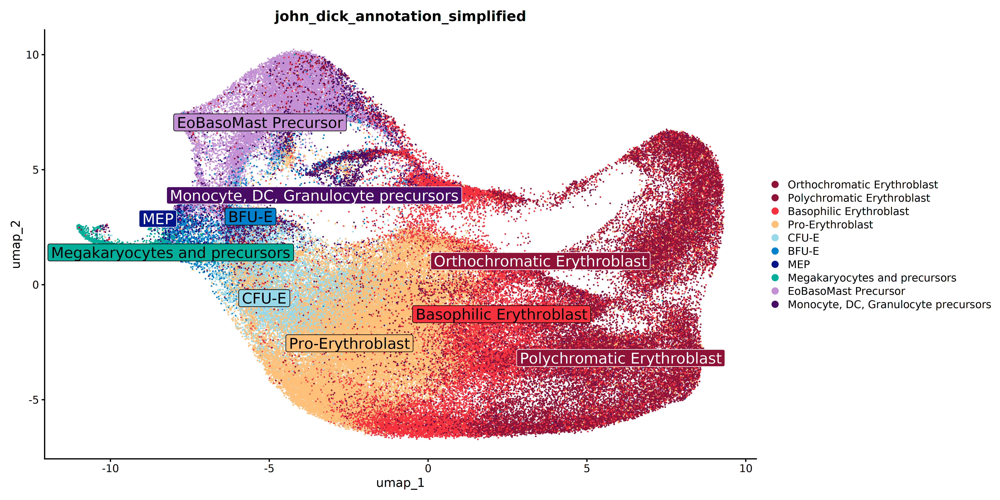

In [18]:
figure_name='JAN_028_RNA_UMAP.pdf'
width=16
height=8
options(repr.plot.width = width, repr.plot.height = height, repr.plot.res = 300)
options(ggrepel.max.overlaps = Inf,box.padding = unit(.25, 'lines'), 
                    point.padding = unit(1.5, 'lines'))



joint_object@meta.data=joint_object@meta.data%>%
mutate(john_dick_annotation_simplified = ifelse(john_dick_annotation %in%top_john_dick_annotations,
                                                john_dick_annotation,"Other"))

joint_object@meta.data=joint_object@meta.data%>%
mutate(john_dick_annotation_simplified = ifelse(john_dick_annotation_simplified %in%
            c("HSC","LMPP","Other","MPP-MkEry","MPP-MyLy","Cycling Progenitor","Stromal","CLP","MLP","Mono and Granulocytic","cDC2","GMP-Mono","Pre-cDC","Pre-pDC","CD14 Mono","Early GMP","Early ProMono","GMP-Neut"),
                                                "Monocyte, DC, Granulocyte precursors",john_dick_annotation_simplified))


joint_object@meta.data=joint_object@meta.data%>%
mutate(john_dick_annotation_simplified = ifelse(john_dick_annotation_simplified %in%
            c("Other"),
                                                "BFU-E",john_dick_annotation_simplified))

joint_object@meta.data=joint_object@meta.data%>%
mutate(john_dick_annotation_simplified = ifelse(john_dick_annotation_simplified %in%
            c("Megakaryocyte","Megakaryocyte Precursor"),
                                                "Megakaryocytes and precursors",john_dick_annotation_simplified))

bueno_colors <- c('Basophilic Erythroblast' = jdb_color_map(c("MEP")),
                  'Orthochromatic Erythroblast' = jdb_color_map(c("Ery")),
                  'Polychromatic Erythroblast' = jdb_color_map(c("Ery")),
                  'Pro-Erythroblast' = jdb_color_map(c("CMP")),
                  'BFU-E'=jdb_color_map(c("CD4")),
                  'CFU-E'=jdb_color_map(c("CLP")),
                  "Megakaryocytes and precursors"=jdb_color_map(c("LMPP")),
                  #"Megakaryocyte"=jdb_color_map(c("LMPP")),
                  "EoBasoMast Precursor"=jdb_color_map(c("pDC")),
                  "Monocyte, DC, Granulocyte precursors"=jdb_color_map(c("NK")),
                  "MEP"=jdb_color_map(c("CD8"))
                 
                 
                 
                 
                 )
label_color=c("black","white","black",
             "black","black","black",
             "white","black",
             "white","white")
joint_object@meta.data$john_dick_annotation_simplified=factor(joint_object@meta.data$john_dick_annotation_simplified,
      levels=c('Orthochromatic Erythroblast',
              'Polychromatic Erythroblast',
              'Basophilic Erythroblast',
              'Pro-Erythroblast',
              'CFU-E',
             'BFU-E', 
              "MEP",
              "Megakaryocytes and precursors",
              "EoBasoMast Precursor",
              "Monocyte, DC, Granulocyte precursors"))


DimPlot(joint_object, reduction = "umap", group.by = "john_dick_annotation_simplified", label = TRUE, label.box=TRUE,label.size = 6, repel = TRUE,cols=bueno_colors,label.color = label_color,raster=FALSE)


#ggsave(paste(output_folder,figure_name,sep=""),dpi = 600, width = width, height = height, units = "in")

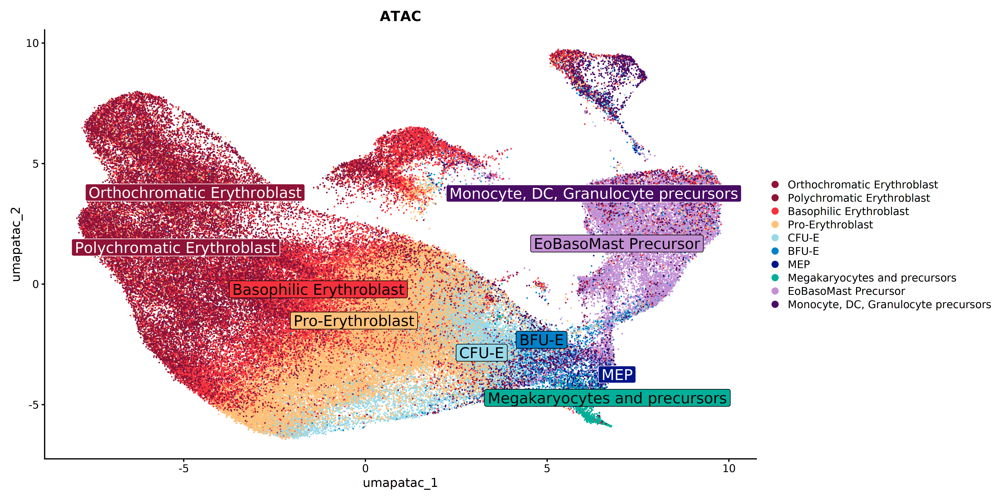

In [19]:
figure_name='JAN_028_ATAC_UMAP.pdf'

DimPlot(joint_object, reduction = "umap_atac", group.by = "john_dick_annotation_simplified", label = TRUE, label.box=TRUE,label.size = 6, repel = TRUE,cols=bueno_colors,label.color = label_color,raster=FALSE) + ggtitle("ATAC")
#ggsave(paste(output_folder,figure_name,sep=""),dpi = 600, width = width, height = height, units = "in")

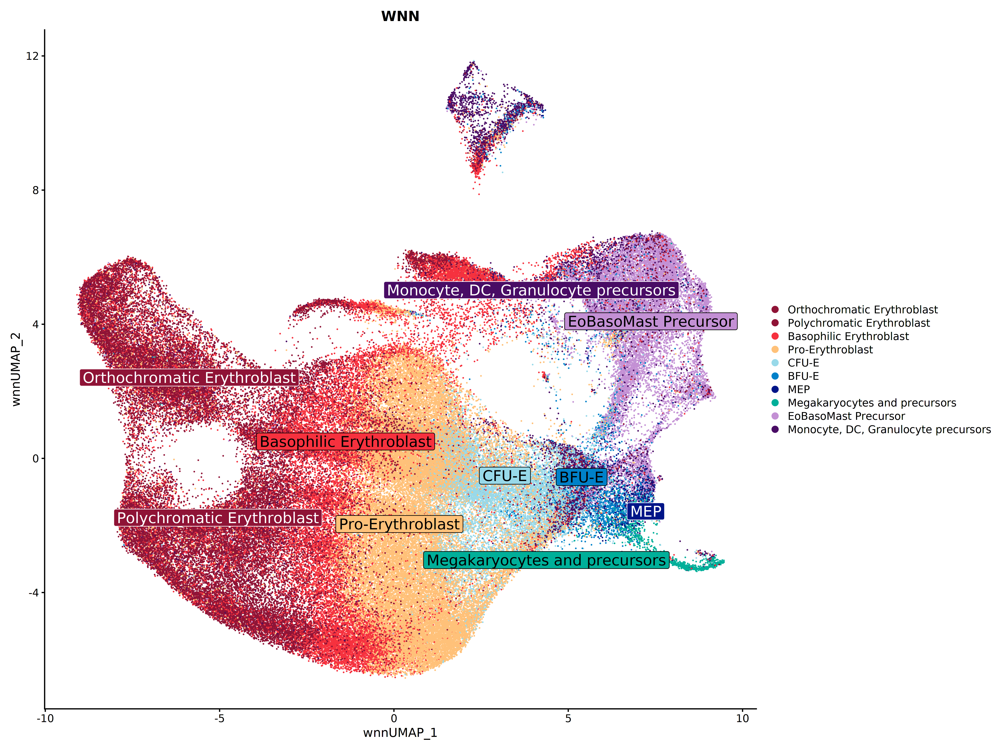

In [20]:
figure_name='JAN_028_wnn_UMAP.pdf'
height=12
options(repr.plot.width = width, repr.plot.height = height, repr.plot.res = 300)

DimPlot(joint_object, reduction = "wnn.umap", group.by = "john_dick_annotation_simplified", label = TRUE, label.box=TRUE,label.size = 6, repel = TRUE,cols=bueno_colors,label.color = label_color,raster=FALSE) + ggtitle("WNN")
#ggsave(paste(output_folder,figure_name,sep=""),dpi = 600, width = width, height = height, units = "in")

In [21]:
#saveRDS(joint_object,"~/github_reproducibility/JAN_028_common_processed_object_with_wnn.RDS")